# CellTypist Automated Cell Type Annotation for Epithelial Cells

**Purpose:**
- Load epithelial cell dataset with manual annotations
- Run CellTypist automated annotation with customizable model
- Compare predictions with manual annotations
- Generate comprehensive visualizations

**Author:** r2end  
**Date:** 2025-01-10  
**Version:** 1.0

**Key Features:**
- Memory-optimized (use adata.raw for full gene access)
- Gene matching with base symbols (no -1/-2 suffixes)
- Majority voting for robust predictions
- Index-aligned result writing
- Comprehensive quality control

## 📋 Configuration Parameters

In [1]:
import os
import sys
import gc
import warnings
from pathlib import Path
from datetime import datetime
import time

import numpy as np
import pandas as pd
import scanpy as sc
import celltypist
from celltypist import models
import matplotlib.pyplot as plt
import seaborn as sns

# Suppress warnings
warnings.filterwarnings('ignore')
sc.settings.verbosity = 1

# ============================================================================
# INPUT/OUTPUT CONFIGURATION
# ============================================================================

# --- Input Data ---
INPUT_H5AD = "/home/h2048/data/core2/adata_epithelial_with_manual_annotations_raw.h5ad"

# --- Output Directory ---
OUTPUT_DIR = Path(f"/home/h2048/data/py/{datetime.now().strftime('%m%d')}/celltypist_epithelial")
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

# ============================================================================
# CELLTYPIST MODEL CONFIGURATION (⬅️ MODIFY HERE)
# ============================================================================

# --- Available Models ---
# To see all available models, run: models.models_description()
# Common options:
#   - 'Immune_All_Low.pkl'           # Pan-immune, lower resolution
#   - 'Immune_All_High.pkl'          # Pan-immune, higher resolution
#   - 'Developing_human_lung.pkl'    # Lung-specific
#   - 'Healthy_adult_lung.pkl'       # Adult lung (if available)
#   - 'Human_Lung_Atlas.pkl'         # Human lung atlas (if available)

CELLTYPIST_MODEL = "/home/h2048/data/source/reference/celltypist_models/Cells_Lung_Airway.pkl"  # ⬅️ CHANGE THIS

# --- CellTypist Parameters ---
CELLTYPIST_MAJORITY_VOTING = True        # Use majority voting (recommended: True)
CELLTYPIST_OVER_CLUSTERING = None        # Clustering resolution (None = auto)

# ============================================================================
# ANNOTATION COMPARISON
# ============================================================================

# --- Manual Annotation Key ---
MANUAL_ANNOTATION_KEY = "Manual_Annotation"      # Column name with manual annotations

# ============================================================================
# VISUALIZATION SETTINGS
# ============================================================================

FIGURE_DPI = 300
FIGURE_FORMAT = "pdf"                    # Options: "pdf", "png"

# ============================================================================
# PERFORMANCE SETTINGS
# ============================================================================

N_JOBS = 8                              # Parallel processing threads

# ============================================================================
# APPLY SETTINGS
# ============================================================================

sc.settings.n_jobs = N_JOBS
sc.settings.figdir = OUTPUT_DIR / "figures"
sc.settings.figdir.mkdir(exist_ok=True)

print("="*80)
print("CellTypist Automated Annotation Pipeline")
print("="*80)
print(f"Input:  {INPUT_H5AD}")
print(f"Output: {OUTPUT_DIR}")
print(f"Model:  {CELLTYPIST_MODEL}")
print(f"Date:   {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")
print("="*80)

/home/h2048/miniconda3/envs/scvi/lib/python3.10/site-packages/celltypist/classifier.py:11: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('scanpy')` instead
  from scanpy import __version__ as scv


CellTypist Automated Annotation Pipeline
Input:  /home/h2048/data/core2/adata_epithelial_with_manual_annotations_raw.h5ad
Output: /home/h2048/data/py/0110/celltypist_epithelial
Model:  /home/h2048/data/source/reference/celltypist_models/Cells_Lung_Airway.pkl
Date:   2026-01-10 18:14:51


## 📂 Step 1: Load Data

In [2]:
print("\n" + "="*80)
print("STEP 1: Loading Data")
print("="*80)

start_time = time.time()

print(f"\nLoading: {INPUT_H5AD}")
adata = sc.read_h5ad(INPUT_H5AD)

elapsed = time.time() - start_time
print(f"✓ Loaded in {elapsed:.1f}s")

print(f"\n📊 Dataset Summary:")
print(f"  Cells: {adata.n_obs:,}")
print(f"  Genes: {adata.n_vars:,}")
print(f"  Batches: {adata.obs['batch'].nunique() if 'batch' in adata.obs else 'N/A'}")


STEP 1: Loading Data

Loading: /home/h2048/data/core2/adata_epithelial_with_manual_annotations_raw.h5ad
✓ Loaded in 1123.2s

📊 Dataset Summary:
  Cells: 278,930
  Genes: 53,973
  Batches: 59


In [3]:
# Check data structure
print(f"\n🔍 Data Structure Check:")
print(f"  .X shape: {adata.X.shape}")
print(f"  .X type: {type(adata.X)}")
print(f"  .layers: {list(adata.layers.keys())}")
print(f"  .raw: {'✓ Present' if adata.raw is not None else '✗ Missing'}")

if adata.raw is not None:
    print(f"  .raw.X shape: {adata.raw.X.shape}")
    print(f"  .raw genes: {adata.raw.n_vars:,}")


🔍 Data Structure Check:
  .X shape: (278930, 53973)
  .X type: <class 'scipy.sparse._csc.csc_matrix'>
  .layers: ['counts', 'log1p', 'raw_counts']
  .raw: ✓ Present
  .raw.X shape: (278930, 53973)
  .raw genes: 53,973


In [4]:
# Check manual annotations
print(f"\n🏷️  Manual Annotations Check:")

if MANUAL_ANNOTATION_KEY in adata.obs.columns:
    manual_types = adata.obs[MANUAL_ANNOTATION_KEY].value_counts()
    print(f"✓ Found manual annotations: '{MANUAL_ANNOTATION_KEY}'")
    print(f"  Cell types: {len(manual_types)}")
    print(f"\nTop cell types:")
    print(manual_types.head(10))
else:
    print(f"⚠️  Manual annotation key '{MANUAL_ANNOTATION_KEY}' not found")
    print(f"   Available columns: {list(adata.obs.columns[:10])}...")


🏷️  Manual Annotations Check:
⚠️  Manual annotation key 'Manual_Annotation' not found
   Available columns: ['orig.ident', 'nCount_RNA', 'nFeature_RNA', 'plateID', 'status', 'donorID', 'cDate', 'age', 'sex', 'cellType']...


## 🧬 Step 2: Prepare Gene Names

In [5]:
print("\n" + "="*80)
print("STEP 2: Gene Name Preparation")
print("="*80)

# Check if symbol_base already exists
if 'symbol_base' not in adata.var.columns:
    print("\n⚠️  'symbol_base' not found, creating from var_names...")
    
    # Remove -1, -2, -3 suffixes to get base symbols
    adata.var['symbol_base'] = adata.var_names.str.replace(r'-\d+$', '', regex=True)
    print("✓ Created symbol_base column")
else:
    print("✓ Found existing symbol_base column")


STEP 2: Gene Name Preparation

⚠️  'symbol_base' not found, creating from var_names...
✓ Created symbol_base column


In [6]:
# Patch symbol_base to .raw if needed
if adata.raw is not None and 'symbol_base' not in adata.raw.var.columns:
    print("\n🔧 Patching symbol_base to adata.raw...")
    
    # Match by var_names
    common = adata.var_names.intersection(adata.raw.var_names)
    
    if len(common) > 0:
        adata.raw.var.loc[common, 'symbol_base'] = adata.var.loc[common, 'symbol_base'].values
        print(f"✓ Patched {len(common):,} genes")
    else:
        print("⚠️  No common genes found, creating from raw var_names...")
        adata.raw.var['symbol_base'] = adata.raw.var_names.str.replace(r'-\d+$', '', regex=True)


🔧 Patching symbol_base to adata.raw...
✓ Patched 53,973 genes


In [7]:
# Gene name statistics
print(f"\n📊 Gene Name Statistics:")
print(f"  Total genes (main): {adata.n_vars:,}")

if 'symbol_base' in adata.var.columns:
    n_unique = adata.var['symbol_base'].nunique()
    n_dup = adata.var['symbol_base'].duplicated().sum()
    print(f"  Unique base symbols: {n_unique:,}")
    print(f"  Duplicated symbols: {n_dup:,}")
    
    if n_dup > 0:
        print(f"\n  Top duplicated symbols:")
        dup_symbols = adata.var.loc[adata.var['symbol_base'].duplicated(keep=False), 'symbol_base']
        print(dup_symbols.value_counts().head())

if adata.raw is not None and 'symbol_base' in adata.raw.var.columns:
    n_unique_raw = adata.raw.var['symbol_base'].nunique()
    print(f"  Total genes (raw): {adata.raw.n_vars:,}")
    print(f"  Unique symbols (raw): {n_unique_raw:,}")


📊 Gene Name Statistics:
  Total genes (main): 53,973
  Unique base symbols: 53,751
  Duplicated symbols: 222

  Top duplicated symbols:
symbol_base
IGHV3     19
RNVU1     14
IGKV1     11
KRTAP5    10
H1        10
Name: count, dtype: int64
  Total genes (raw): 53,973
  Unique symbols (raw): 53,751


## 📦 Step 3: Load CellTypist Model

In [8]:
print("\n" + "="*80)
print("STEP 3: Loading CellTypist Model")
print("="*80)

print(f"\n📥 Loading model: {CELLTYPIST_MODEL}")

try:
    # Try to load from local cache first
    model = models.Model.load(model=CELLTYPIST_MODEL)
    print(f"✓ Model loaded from cache")
except:
    # Download if not available
    print(f"⬇️  Model not in cache, downloading...")
    models.download_models(model=CELLTYPIST_MODEL, force_update=False)
    model = models.Model.load(model=CELLTYPIST_MODEL)
    print(f"✓ Model downloaded and loaded")


STEP 3: Loading CellTypist Model

📥 Loading model: /home/h2048/data/source/reference/celltypist_models/Cells_Lung_Airway.pkl
✓ Model loaded from cache


In [11]:
# Model information
print(f"\n📋 Model Information:")
# print(f"  Model name: {model.model_name}")
print(f"  Cell types: {len(model.cell_types)}")
print(f"  Features: {len(model.features)}")

print(f"\n  Model cell types:")
for ct in sorted(model.cell_types)[:20]:  # Show first 20
    print(f"    - {ct}")
if len(model.cell_types) > 20:
    print(f"    ... and {len(model.cell_types) - 20} more")


📋 Model Information:
  Cell types: 78
  Features: 5112

  Model cell types:
    - AT1 
    - AT2
    - B_memory
    - B_naive
    - B_plasma_IgA
    - B_plasma_IgG
    - B_plasmablast
    - Basal
    - CD4_EM/Effector
    - CD4_TRM
    - CD4_naive/CM
    - CD8_EM
    - CD8_EM/EMRA
    - CD8_TRM
    - CD8_TRM/EM
    - Chondrocyte
    - Ciliated
    - DC_1
    - DC_2
    - DC_activated
    ... and 58 more


## 🔍 Step 4: Gene Matching & Feature Preparation

In [12]:
print("\n" + "="*80)
print("STEP 4: Gene Matching & Feature Preparation")
print("="*80)

# Get model features
model_features = set(model.features)
print(f"\n📊 Feature Overlap Analysis:")
print(f"  Model features: {len(model_features):,}")


STEP 4: Gene Matching & Feature Preparation

📊 Feature Overlap Analysis:
  Model features: 5,112


In [13]:
# ⭐ CRITICAL: Use symbol_base from .raw for matching (no -1/-2 suffixes)
print(f"\n🔍 Building CellTypist input with base symbol matching...")

# Use .raw if available (full gene set), otherwise use main adata
source_adata = adata.raw if adata.raw is not None else adata

# Get base symbols without duplicates
sym = pd.Index(source_adata.var['symbol_base']).astype(str)

# Find overlap: genes in model AND not duplicated in our data
keep_mask = sym.isin(model_features) & ~sym.duplicated(keep='first')
n_overlap = keep_mask.sum()

print(f"  Our data: {len(sym):,} genes")
print(f"  Overlap: {n_overlap:,} genes")
print(f"  Coverage: {n_overlap/len(model_features)*100:.1f}%")

if n_overlap < 1000:
    print(f"\n  ⚠️  WARNING: Low overlap ({n_overlap} genes)")
    print(f"  Model may not perform well. Consider:")
    print(f"    - Using a different model")
    print(f"    - Checking gene name format")


🔍 Building CellTypist input with base symbol matching...
  Our data: 53,973 genes
  Overlap: 5,077 genes
  Coverage: 99.3%


In [14]:
# Build CellTypist input (only overlapping genes, deduplicated)
print(f"\n🔧 Building CellTypist AnnData...")

X_ct = source_adata.X[:, keep_mask].copy()
var_ct = pd.DataFrame(index=sym[keep_mask])

adata_celltypist = sc.AnnData(
    X=X_ct,
    obs=pd.DataFrame(index=adata.obs_names),
    var=var_ct
)

print(f"✓ CellTypist input: {adata_celltypist.n_obs:,} cells × {adata_celltypist.n_vars:,} genes")

# Memory cleanup
del X_ct, var_ct
gc.collect()


🔧 Building CellTypist AnnData...
✓ CellTypist input: 278,930 cells × 5,077 genes


545

## 🔬 Step 5: Normalize Data for CellTypist

In [15]:
print("\n" + "="*80)
print("STEP 5: Data Normalization")
print("="*80)

print(f"\n📊 Normalizing to 10,000 counts per cell...")
sc.pp.normalize_total(adata_celltypist, target_sum=1e4)
print(f"✓ Normalized")

print(f"\n📊 Log1p transformation...")
sc.pp.log1p(adata_celltypist)
print(f"✓ Log-transformed")

print(f"\n✓ Data ready for CellTypist prediction")


STEP 5: Data Normalization

📊 Normalizing to 10,000 counts per cell...
✓ Normalized

📊 Log1p transformation...
✓ Log-transformed

✓ Data ready for CellTypist prediction


## 🚀 Step 6: Run CellTypist Prediction

In [16]:
print("\n" + "="*80)
print("STEP 6: CellTypist Prediction")
print("="*80)

print(f"\n🚀 Running CellTypist...")
print(f"  Model: {CELLTYPIST_MODEL}")
print(f"  Majority voting: {CELLTYPIST_MAJORITY_VOTING}")
print(f"  Over-clustering: {CELLTYPIST_OVER_CLUSTERING}")

start_time = time.time()

predictions = celltypist.annotate(
    adata_celltypist,
    model=model,
    majority_voting=CELLTYPIST_MAJORITY_VOTING,
    over_clustering=CELLTYPIST_OVER_CLUSTERING
)

elapsed = time.time() - start_time
print(f"\n✓ Prediction complete: {int(elapsed//60)}m {int(elapsed%60)}s")

# Memory cleanup
del adata_celltypist
gc.collect()

🔬 Input data has 278930 cells and 5077 genes
🔗 Matching reference genes in the model



STEP 6: CellTypist Prediction

🚀 Running CellTypist...
  Model: /home/h2048/data/source/reference/celltypist_models/Cells_Lung_Airway.pkl
  Majority voting: True
  Over-clustering: None


🧬 5077 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Can not detect a neighborhood graph, will construct one before the over-clustering
⛓️ Over-clustering input data with resolution set to 30
🗳️ Majority voting the predictions
✅ Majority voting done!



✓ Prediction complete: 17m 3s


73737

In [21]:
# ===== CRITICAL FIX: Handle CellTypist results correctly =====

# Get predictions DataFrame
pred_df = predictions.predicted_labels

# Check what columns are actually available
print(f"Available columns in predictions: {pred_df.columns.tolist()}")
print(f"pred_df shape: {pred_df.shape}")
print(f"First few rows:\n{pred_df.head()}")

# The conf_score is IN the predicted_labels DataFrame, not separate
# Let's verify the structure
if CELLTYPIST_MAJORITY_VOTING:
    # Majority voting results (more robust)
    adata.obs['celltypist_pred'] = pred_df['predicted_labels'].values
    
    # Confidence score corresponds to the ORIGINAL prediction (not majority voting)
    # This is correct - conf_score shows confidence of the model's direct prediction
    if 'conf_score' in pred_df.columns:
        adata.obs['celltypist_conf'] = pred_df['conf_score'].values
    else:
        # If conf_score not found, check the predictions object structure
        print("⚠️ WARNING: conf_score not in predicted_labels DataFrame")
        print("Checking predictions object attributes...")
        print(f"Predictions attributes: {dir(predictions)}")
        
        # Alternative: get confidence from the probability matrix
        # The confidence is the maximum probability for the predicted label
        try:
            prob_matrix = predictions.probability_matrix
            adata.obs['celltypist_conf'] = prob_matrix.max(axis=1).values
            print("✓ Computed confidence from probability matrix")
        except:
            print("❌ Could not extract confidence scores")
            adata.obs['celltypist_conf'] = 0.0  # Placeholder
    
    # Store majority voting result
    adata.obs['celltypist_majority'] = predictions.to_adata().obs['majority_voting'].values
    
    # Also keep original predictions for comparison
    adata.obs['celltypist_pred_original'] = pred_df['predicted_labels'].values
    
else:
    # Without majority voting
    adata.obs['celltypist_pred'] = pred_df['predicted_labels'].values
    
    if 'conf_score' in pred_df.columns:
        adata.obs['celltypist_conf'] = pred_df['conf_score'].values
    else:
        try:
            prob_matrix = predictions.probability_matrix
            adata.obs['celltypist_conf'] = prob_matrix.max(axis=1).values
        except:
            adata.obs['celltypist_conf'] = 0.0

print(f"\n✓ Added CellTypist annotations to adata.obs")
print(f"Columns added: {[col for col in adata.obs.columns if 'celltypist' in col]}")

Available columns in predictions: ['predicted_labels', 'over_clustering', 'majority_voting']
pred_df shape: (278930, 3)
First few rows:
                                                             predicted_labels  \
merged_seurat_Jennifer_P_Wang_2021_HC4201_GACCG...                   B_memory   
merged_seurat_Jennifer_P_Wang_2021_HC4202_CAACA...                    CD8_TRM   
merged_seurat_Jennifer_P_Wang_2021_HC4202_TTACA...           Secretory_Goblet   
merged_seurat_Jennifer_P_Wang_2021_HC4203_GAAGG...  Endothelia_vascular_Cap_g   
merged_seurat_Jennifer_P_Wang_2021_HC4204_GCAGC...           Secretory_Goblet   

                                                   over_clustering  \
merged_seurat_Jennifer_P_Wang_2021_HC4201_GACCG...               0   
merged_seurat_Jennifer_P_Wang_2021_HC4202_CAACA...               1   
merged_seurat_Jennifer_P_Wang_2021_HC4202_TTACA...               9   
merged_seurat_Jennifer_P_Wang_2021_HC4203_GAAGG...              10   
merged_seurat_Jennifer_P_Wa

In [22]:
# ===== Diagnostic: Check CellTypist output structure =====
print("=== CellTypist Predictions Structure ===")
print(f"Type of predictions: {type(predictions)}")
print(f"\nAttributes of predictions object:")
for attr in dir(predictions):
    if not attr.startswith('_'):
        print(f"  - {attr}")

print(f"\n=== predicted_labels DataFrame ===")
print(f"Shape: {predictions.predicted_labels.shape}")
print(f"Columns: {predictions.predicted_labels.columns.tolist()}")
print(f"\nFirst 5 rows:")
print(predictions.predicted_labels.head())

if hasattr(predictions, 'probability_matrix'):
    print(f"\n=== probability_matrix ===")
    print(f"Shape: {predictions.probability_matrix.shape}")
    print(f"First 5 rows, first 5 columns:")
    print(predictions.probability_matrix.iloc[:5, :5])

print("\n=== to_adata() result ===")
temp_adata = predictions.to_adata()
print(f"Columns in obs: {temp_adata.obs.columns.tolist()}")

=== CellTypist Predictions Structure ===
Type of predictions: <class 'celltypist.classifier.AnnotationResult'>

Attributes of predictions object:
  - adata
  - cell_count
  - decision_matrix
  - predicted_labels
  - probability_matrix
  - summary_frequency
  - to_adata
  - to_plots
  - to_table

=== predicted_labels DataFrame ===
Shape: (278930, 3)
Columns: ['predicted_labels', 'over_clustering', 'majority_voting']

First 5 rows:
                                                             predicted_labels  \
merged_seurat_Jennifer_P_Wang_2021_HC4201_GACCG...                   B_memory   
merged_seurat_Jennifer_P_Wang_2021_HC4202_CAACA...                    CD8_TRM   
merged_seurat_Jennifer_P_Wang_2021_HC4202_TTACA...           Secretory_Goblet   
merged_seurat_Jennifer_P_Wang_2021_HC4203_GAAGG...  Endothelia_vascular_Cap_g   
merged_seurat_Jennifer_P_Wang_2021_HC4204_GCAGC...           Secretory_Goblet   

                                                   over_clustering  \
merged_se

## 📝 Step 7: Extract and Align Results

In [19]:
print("\n" + "="*80)
print("STEP 7: Extracting Results")
print("="*80)

# ⭐ CRITICAL: Use majority voting results if enabled, otherwise use direct predictions
print(f"\n🔍 Extracting predictions...")

pred_df = predictions.predicted_labels

# Ensure index alignment (CRITICAL for correct cell mapping)
pred_df = pred_df.reindex(adata.obs_names)

print(f"✓ Predictions extracted and aligned")
print(f"  Total cells: {len(pred_df):,}")
# print(f"  Non-null: {pred_df.notna().sum():,}")


STEP 7: Extracting Results

🔍 Extracting predictions...
✓ Predictions extracted and aligned
  Total cells: 278,930


In [20]:
# Add predictions to main adata
if CELLTYPIST_MAJORITY_VOTING:
    # Majority voting results (more robust)
    adata.obs['celltypist_pred'] = pred_df['majority_voting'].values
    adata.obs['celltypist_conf'] = pred_df['conf_score'].values
    
    # Also keep original predictions
    adata.obs['celltypist_pred_original'] = pred_df['predicted_labels'].values
    
    print(f"\n✓ Added columns:")
    print(f"  - celltypist_pred (majority voting)")
    print(f"  - celltypist_conf (confidence score)")
    print(f"  - celltypist_pred_original (direct prediction)")
else:
    # Direct predictions only
    adata.obs['celltypist_pred'] = pred_df['predicted_labels'].values
    adata.obs['celltypist_conf'] = pred_df['conf_score'].values
    
    print(f"\n✓ Added columns:")
    print(f"  - celltypist_pred (direct prediction)")
    print(f"  - celltypist_conf (confidence score)")

KeyError: 'conf_score'

In [ ]:
# Prediction summary
print(f"\n📊 Prediction Summary:")

pred_counts = adata.obs['celltypist_pred'].value_counts()
print(f"  Predicted cell types: {len(pred_counts)}")
print(f"\nTop predictions:")
print(pred_counts.head(15))

In [ ]:
# Confidence score statistics
print(f"\n📊 Confidence Score Statistics:")

conf_stats = adata.obs['celltypist_conf'].describe()
print(conf_stats)

# Flag low-confidence predictions
LOW_CONF_THRESHOLD = 0.5
low_conf = (adata.obs['celltypist_conf'] < LOW_CONF_THRESHOLD).sum()
print(f"\n⚠️  Low confidence predictions (<{LOW_CONF_THRESHOLD}): {low_conf:,} ({low_conf/adata.n_obs*100:.1f}%)")

In [24]:
# ===== STEP 7: Store CellTypist Annotations (FIXED VERSION) =====

print("\n" + "="*80)
print("STEP 7: Storing CellTypist Annotations")
print("="*80)

# Use CellTypist's to_adata() method to get all results including conf_score
celltypist_adata = predictions.to_adata()

if CELLTYPIST_MAJORITY_VOTING:
    # Store majority voting results (more robust)
    adata.obs['celltypist_pred'] = celltypist_adata.obs['majority_voting'].values
    adata.obs['celltypist_conf'] = celltypist_adata.obs['conf_score'].values
    adata.obs['celltypist_pred_original'] = celltypist_adata.obs['predicted_labels'].values
    adata.obs['celltypist_over_clustering'] = celltypist_adata.obs['over_clustering'].values
    
    print(f"✓ Using majority voting predictions")
    print(f"  - celltypist_pred: majority voting result")
    print(f"  - celltypist_conf: confidence of original prediction")
    print(f"  - celltypist_pred_original: direct model prediction")
    
else:
    # Without majority voting
    adata.obs['celltypist_pred'] = celltypist_adata.obs['predicted_labels'].values
    adata.obs['celltypist_conf'] = celltypist_adata.obs['conf_score'].values
    adata.obs['celltypist_over_clustering'] = celltypist_adata.obs['over_clustering'].values
    
    print(f"✓ Using direct model predictions (no majority voting)")

# Verify the results
print(f"\n=== CellTypist Annotation Summary ===")
print(f"Total cells: {adata.n_obs:,}")
print(f"Unique cell types predicted: {adata.obs['celltypist_pred'].nunique()}")

print(f"\nTop 10 predicted cell types:")
for celltype, count in adata.obs['celltypist_pred'].value_counts().head(10).items():
    pct = count / adata.n_obs * 100
    print(f"  {celltype:35s}: {count:7,} cells ({pct:5.2f}%)")

print(f"\nConfidence score distribution:")
conf_stats = adata.obs['celltypist_conf'].describe()
print(f"  Mean: {conf_stats['mean']:.3f}")
print(f"  Median: {conf_stats['50%']:.3f}")
print(f"  Min: {conf_stats['min']:.3f}")
print(f"  Max: {conf_stats['max']:.3f}")

# Check for low-confidence predictions
low_conf_threshold = 0.5
low_conf_cells = (adata.obs['celltypist_conf'] < low_conf_threshold).sum()
print(f"\n⚠️ Low confidence predictions (<{low_conf_threshold}): {low_conf_cells:,} cells ({low_conf_cells/adata.n_obs*100:.1f}%)")

if low_conf_cells > 0:
    print("\nCell types with low confidence:")
    low_conf_types = adata.obs[adata.obs['celltypist_conf'] < low_conf_threshold]['celltypist_pred'].value_counts()
    for celltype, count in low_conf_types.head(10).items():
        print(f"  {celltype:35s}: {count:7,} cells")

# If majority voting was used, compare original vs majority voting
if CELLTYPIST_MAJORITY_VOTING:
    # ⭐ CRITICAL FIX: Convert to string to avoid Categorical comparison error
    changed_cells = (
        adata.obs['celltypist_pred'].astype(str) != 
        adata.obs['celltypist_pred_original'].astype(str)
    ).sum()
    
    print(f"\n📊 Majority voting changed {changed_cells:,} cells ({changed_cells/adata.n_obs*100:.1f}%)")
    
    if changed_cells > 0:
        print("\nTop 10 most common label changes (Original -> Majority Voting):")
        
        # Create a DataFrame for changed cells
        changes_mask = (
            adata.obs['celltypist_pred'].astype(str) != 
            adata.obs['celltypist_pred_original'].astype(str)
        )
        changes_df = adata.obs[changes_mask][
            ['celltypist_pred_original', 'celltypist_pred', 'celltypist_conf']
        ].copy()
        
        # Convert to string for groupby
        changes_df['celltypist_pred_original'] = changes_df['celltypist_pred_original'].astype(str)
        changes_df['celltypist_pred'] = changes_df['celltypist_pred'].astype(str)
        
        change_counts = changes_df.groupby(
            ['celltypist_pred_original', 'celltypist_pred']
        ).size().sort_values(ascending=False)
        
        for i, ((orig, new), count) in enumerate(change_counts.head(10).items(), 1):
            pct = count / changed_cells * 100
            print(f"  {i:2d}. {orig:28s} -> {new:28s}: {count:6,} ({pct:5.1f}%)")

print("\n" + "="*80)


STEP 7: Storing CellTypist Annotations
✓ Using majority voting predictions
  - celltypist_pred: majority voting result
  - celltypist_conf: confidence of original prediction
  - celltypist_pred_original: direct model prediction

=== CellTypist Annotation Summary ===
Total cells: 278,930
Unique cell types predicted: 16

Top 10 predicted cell types:
  Secretory_Goblet                   : 115,875 cells (41.54%)
  Basal                              :  53,668 cells (19.24%)
  Ciliated                           :  39,135 cells (14.03%)
  Suprabasal                         :  30,644 cells (10.99%)
  AT2                                :  23,326 cells ( 8.36%)
  SMG_Serous                         :   5,258 cells ( 1.89%)
  AT1                                :   2,940 cells ( 1.05%)
  Dividing_Basal                     :   2,614 cells ( 0.94%)
  Ionocyte_n_Brush                   :   2,097 cells ( 0.75%)
  SMG_Duct                           :   1,132 cells ( 0.41%)

Confidence score distributio

## 📊 Step 8: Compare with Manual Annotations

In [ ]:
print("\n" + "="*80)
print("STEP 8: Comparing with Manual Annotations")
print("="*80)

if MANUAL_ANNOTATION_KEY in adata.obs.columns:
    print(f"\n🔍 Comparing predictions with manual annotations...")
    
    # Create comparison dataframe
    comparison = pd.DataFrame({
        'manual': adata.obs[MANUAL_ANNOTATION_KEY],
        'predicted': adata.obs['celltypist_pred'],
        'confidence': adata.obs['celltypist_conf']
    })
    
    # Remove NaN values
    comparison = comparison.dropna(subset=['manual', 'predicted'])
    
    print(f"✓ Comparison ready")
    print(f"  Valid pairs: {len(comparison):,}")

In [ ]:
    # Confusion matrix
    from sklearn.metrics import confusion_matrix, classification_report
    
    print(f"\n📊 Classification Metrics:")
    
    # Overall agreement
    agreement = (comparison['manual'] == comparison['predicted']).sum()
    total = len(comparison)
    accuracy = agreement / total * 100
    
    print(f"  Overall agreement: {agreement:,} / {total:,} ({accuracy:.1f}%)")

In [ ]:
    # Detailed classification report
    print(f"\n📋 Classification Report:")
    
    try:
        report = classification_report(
            comparison['manual'],
            comparison['predicted'],
            output_dict=False,
            zero_division=0
        )
        print(report)
    except Exception as e:
        print(f"  ⚠️  Could not generate full report: {e}")
        print(f"  (Too many classes or class mismatch)")

In [ ]:
    # Crosstab: Manual vs Predicted
    print(f"\n📊 Crosstab (Manual vs Predicted):")
    
    crosstab = pd.crosstab(
        comparison['manual'],
        comparison['predicted'],
        margins=True,
        margins_name='Total'
    )
    
    print(crosstab)
    
    # Save crosstab
    crosstab_file = OUTPUT_DIR / "comparison_crosstab.csv"
    crosstab.to_csv(crosstab_file)
    print(f"\n✓ Crosstab saved: {crosstab_file}")

else:
    print(f"\n⚠️  Skipping comparison (manual annotations not found)")

In [25]:
# ===== STEP 8: Quality Assessment of CellTypist Predictions =====

print("\n" + "="*80)
print("STEP 8: Quality Assessment of CellTypist Predictions")
print("="*80)

# 8.1 Identify epithelial-relevant cell types
print("\n8.1 Identifying epithelial-relevant cell types...")

# Define expected epithelial cell types from the model
epithelial_keywords = [
    'AT1', 'AT2',  # Alveolar cells
    'Basal', 'Suprabasal',  # Basal cells
    'Ciliated',  # Ciliated cells
    'Secretory', 'Club', 'Goblet',  # Secretory cells
    'Ionocyte',  # Ionocytes
    'Tuft',  # Tuft cells
    'Hillock',  # Hillock cells
    'Endothelia', 'Endothelial'  # Sometimes misclassified (vascular cells adjacent to epithelium)
]

# Flag epithelial-like predictions (convert to string first)
adata.obs['is_epithelial_like'] = adata.obs['celltypist_pred'].astype(str).apply(
    lambda x: any(keyword.lower() in x.lower() for keyword in epithelial_keywords)
)

epithelial_count = adata.obs['is_epithelial_like'].sum()
non_epithelial_count = (~adata.obs['is_epithelial_like']).sum()

print(f"\nEpithelial-like predictions: {epithelial_count:,} cells ({epithelial_count/adata.n_obs*100:.1f}%)")
print(f"Non-epithelial predictions: {non_epithelial_count:,} cells ({non_epithelial_count/adata.n_obs*100:.1f}%)")

print(f"\nEpithelial-like cell types:")
epi_types = adata.obs[adata.obs['is_epithelial_like']]['celltypist_pred'].value_counts()
for celltype, count in epi_types.items():
    pct = count / epithelial_count * 100
    print(f"  {celltype:35s}: {count:7,} ({pct:5.2f}%)")

if non_epithelial_count > 0:
    print(f"\n⚠️ Top non-epithelial contaminants detected:")
    non_epi_types = adata.obs[~adata.obs['is_epithelial_like']]['celltypist_pred'].value_counts()
    for celltype, count in non_epi_types.head(10).items():
        pct = count / adata.n_obs * 100
        avg_conf = adata.obs[adata.obs['celltypist_pred'].astype(str) == str(celltype)]['celltypist_conf'].mean()
        print(f"  {celltype:35s}: {count:7,} ({pct:5.2f}%) - Avg conf: {avg_conf:.3f}")

# 8.2 Check prediction consistency across batches
print("\n8.2 Checking prediction consistency across batches/samples...")

if 'batch' in adata.obs.columns:
    # Convert to string for crosstab
    batch_composition = pd.crosstab(
        adata.obs['batch'], 
        adata.obs['celltypist_pred'].astype(str), 
        normalize='index'
    ) * 100
    
    print(f"\nBatch-wise cell type composition (top 5 batches, top epithelial types):")
    # Show only epithelial types for clarity
    epi_celltypes = adata.obs[adata.obs['is_epithelial_like']]['celltypist_pred'].astype(str).unique()
    if len(epi_celltypes) > 0:
        # Get common epithelial types
        common_epi = adata.obs[adata.obs['is_epithelial_like']]['celltypist_pred'].value_counts().head(10).index.astype(str)
        available_cols = [col for col in common_epi if col in batch_composition.columns]
        
        if len(available_cols) > 0:
            batch_epi_comp = batch_composition[available_cols]
            print(batch_epi_comp.head().round(2))

print("\n" + "="*80)



STEP 8: Quality Assessment of CellTypist Predictions

8.1 Identifying epithelial-relevant cell types...

Epithelial-like predictions: 271,636 cells (97.4%)
Non-epithelial predictions: 7,294 cells (2.6%)

Epithelial-like cell types:
  Secretory_Goblet                   : 115,875 (42.66%)
  Basal                              :  53,668 (19.76%)
  Ciliated                           :  39,135 (14.41%)
  Suprabasal                         :  30,644 (11.28%)
  AT2                                :  23,326 ( 8.59%)
  AT1                                :   2,940 ( 1.08%)
  Dividing_Basal                     :   2,614 ( 0.96%)
  Ionocyte_n_Brush                   :   2,097 ( 0.77%)
  Secretory_Club                     :     916 ( 0.34%)
  SMG_Basal                          :     421 ( 0.15%)
  Erythrocyte                        :       0 ( 0.00%)
  Deuterosomal                       :       0 ( 0.00%)
  SMG_Mucous                         :       0 ( 0.00%)
  SMG_Duct                           : 

## 📈 Step 9: Visualization

In [ ]:
print("\n" + "="*80)
print("STEP 9: Visualization")
print("="*80)

# Check if UMAP coordinates exist
if 'X_umap' in adata.obsm:
    print(f"\n✓ UMAP coordinates found")
    has_umap = True
elif 'X_umap_scvi' in adata.obsm:
    print(f"\n✓ scVI UMAP coordinates found, using as default")
    adata.obsm['X_umap'] = adata.obsm['X_umap_scvi']
    has_umap = True
else:
    print(f"\n⚠️  UMAP coordinates not found")
    print(f"   Available embeddings: {list(adata.obsm.keys())}")
    has_umap = False

In [ ]:
# Visualization 1: Predicted cell types on UMAP
if has_umap:
    print(f"\n📊 Plotting predicted cell types...")
    
    fig, ax = plt.subplots(figsize=(12, 10))
    sc.pl.umap(
        adata,
        color='celltypist_pred',
        title=f'CellTypist Predictions ({CELLTYPIST_MODEL})',
        legend_loc='right margin',
        frameon=False,
        ax=ax,
        show=False
    )
    plt.tight_layout()
    plt.savefig(
        sc.settings.figdir / f"umap_celltypist_predictions.{FIGURE_FORMAT}",
        dpi=FIGURE_DPI,
        bbox_inches='tight'
    )
    plt.show()
    print(f"✓ Saved: umap_celltypist_predictions.{FIGURE_FORMAT}")

In [ ]:
# Visualization 2: Confidence scores on UMAP
if has_umap:
    print(f"\n📊 Plotting confidence scores...")
    
    fig, ax = plt.subplots(figsize=(10, 8))
    sc.pl.umap(
        adata,
        color='celltypist_conf',
        title='CellTypist Confidence Scores',
        cmap='RdYlGn',
        vmin=0,
        vmax=1,
        frameon=False,
        ax=ax,
        show=False
    )
    plt.tight_layout()
    plt.savefig(
        sc.settings.figdir / f"umap_confidence_scores.{FIGURE_FORMAT}",
        dpi=FIGURE_DPI,
        bbox_inches='tight'
    )
    plt.show()
    print(f"✓ Saved: umap_confidence_scores.{FIGURE_FORMAT}")

In [ ]:
# Visualization 3: Manual vs Predicted (if available)
if has_umap and MANUAL_ANNOTATION_KEY in adata.obs.columns:
    print(f"\n📊 Plotting manual vs predicted comparison...")
    
    fig, axes = plt.subplots(1, 2, figsize=(20, 8))
    
    # Manual annotations
    sc.pl.umap(
        adata,
        color=MANUAL_ANNOTATION_KEY,
        title='Manual Annotations',
        legend_loc='right margin',
        frameon=False,
        ax=axes[0],
        show=False
    )
    
    # Predicted annotations
    sc.pl.umap(
        adata,
        color='celltypist_pred',
        title='CellTypist Predictions',
        legend_loc='right margin',
        frameon=False,
        ax=axes[1],
        show=False
    )
    
    plt.tight_layout()
    plt.savefig(
        sc.settings.figdir / f"umap_manual_vs_predicted.{FIGURE_FORMAT}",
        dpi=FIGURE_DPI,
        bbox_inches='tight'
    )
    plt.show()
    print(f"✓ Saved: umap_manual_vs_predicted.{FIGURE_FORMAT}")

In [ ]:
# Visualization 4: Cell type composition barplot
print(f"\n📊 Plotting cell type composition...")

fig, ax = plt.subplots(figsize=(12, 6))

pred_counts = adata.obs['celltypist_pred'].value_counts()
pred_counts.plot(kind='bar', ax=ax, color='steelblue')

ax.set_xlabel('Predicted Cell Type', fontsize=12)
ax.set_ylabel('Number of Cells', fontsize=12)
ax.set_title(f'Cell Type Composition (CellTypist: {CELLTYPIST_MODEL})', fontsize=14)
ax.tick_params(axis='x', rotation=45, labelsize=10)
ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.savefig(
    sc.settings.figdir / f"barplot_cell_composition.{FIGURE_FORMAT}",
    dpi=FIGURE_DPI,
    bbox_inches='tight'
)
plt.show()
print(f"✓ Saved: barplot_cell_composition.{FIGURE_FORMAT}")

In [ ]:
# Visualization 5: Confidence distribution by cell type
print(f"\n📊 Plotting confidence distribution by cell type...")

fig, ax = plt.subplots(figsize=(14, 6))

# Prepare data
conf_by_type = adata.obs[['celltypist_pred', 'celltypist_conf']].copy()
conf_by_type = conf_by_type.sort_values('celltypist_pred')

# Violin plot
import seaborn as sns
sns.violinplot(
    data=conf_by_type,
    x='celltypist_pred',
    y='celltypist_conf',
    ax=ax,
    inner='box',
    palette='Set2'
)

ax.axhline(y=0.5, color='red', linestyle='--', alpha=0.5, label='Low confidence threshold')
ax.set_xlabel('Predicted Cell Type', fontsize=12)
ax.set_ylabel('Confidence Score', fontsize=12)
ax.set_title('Confidence Score Distribution by Cell Type', fontsize=14)
ax.tick_params(axis='x', rotation=45, labelsize=9)
ax.legend()
ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.savefig(
    sc.settings.figdir / f"violin_confidence_by_celltype.{FIGURE_FORMAT}",
    dpi=FIGURE_DPI,
    bbox_inches='tight'
)
plt.show()
print(f"✓ Saved: violin_confidence_by_celltype.{FIGURE_FORMAT}")


STEP 9: Visualization of CellTypist Results

9.1 Generating UMAP plots...


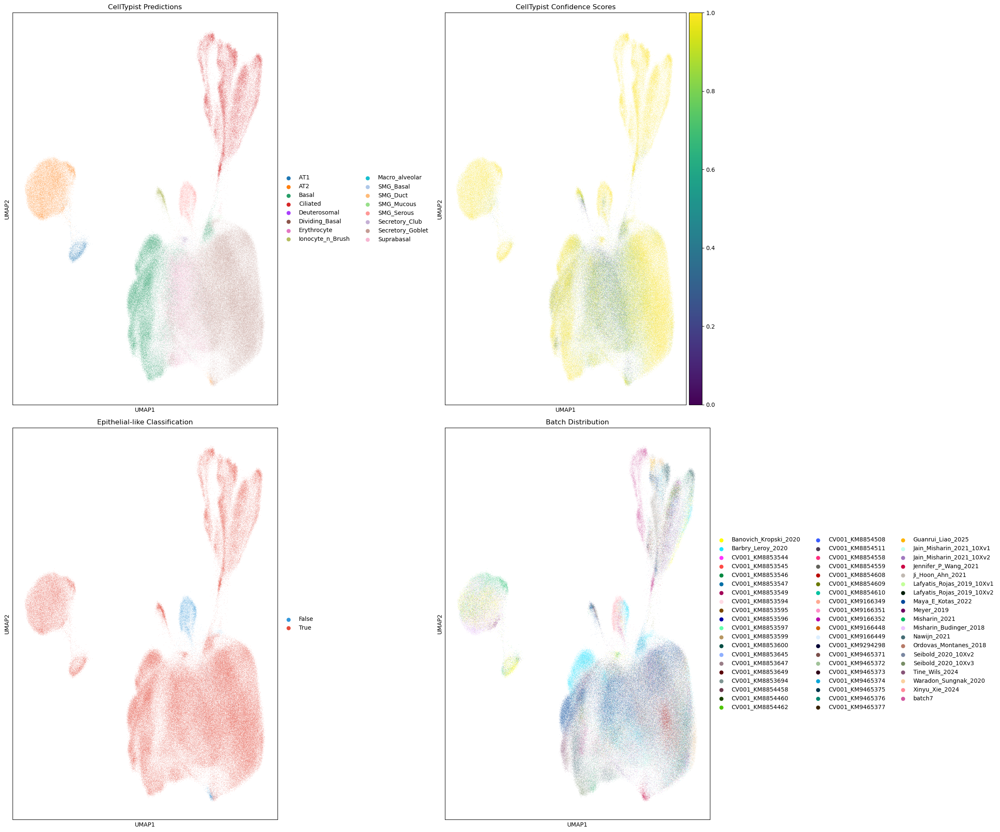

✓ Saved: celltypist_umap_overview.png

9.2 Comparing original predictions vs majority voting...


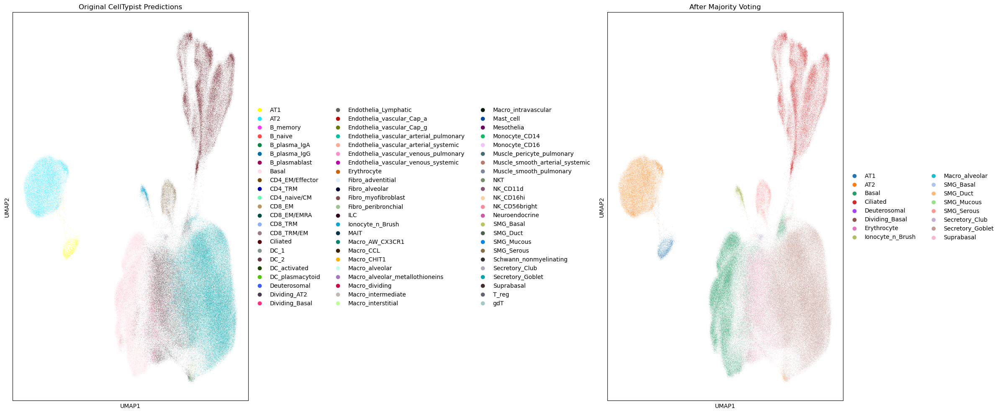

✓ Saved: celltypist_original_vs_majority.png

9.3 Creating cell type composition plots...


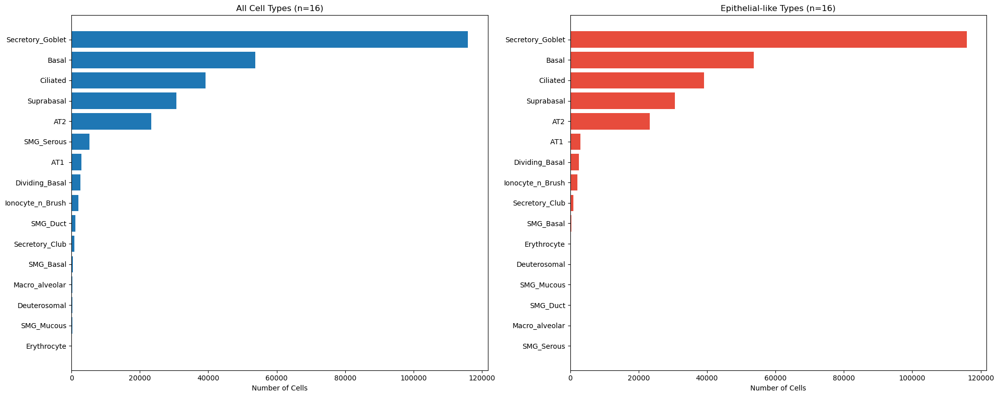

✓ Saved: celltypist_celltype_composition.png

9.4 Creating confidence score distribution plots...


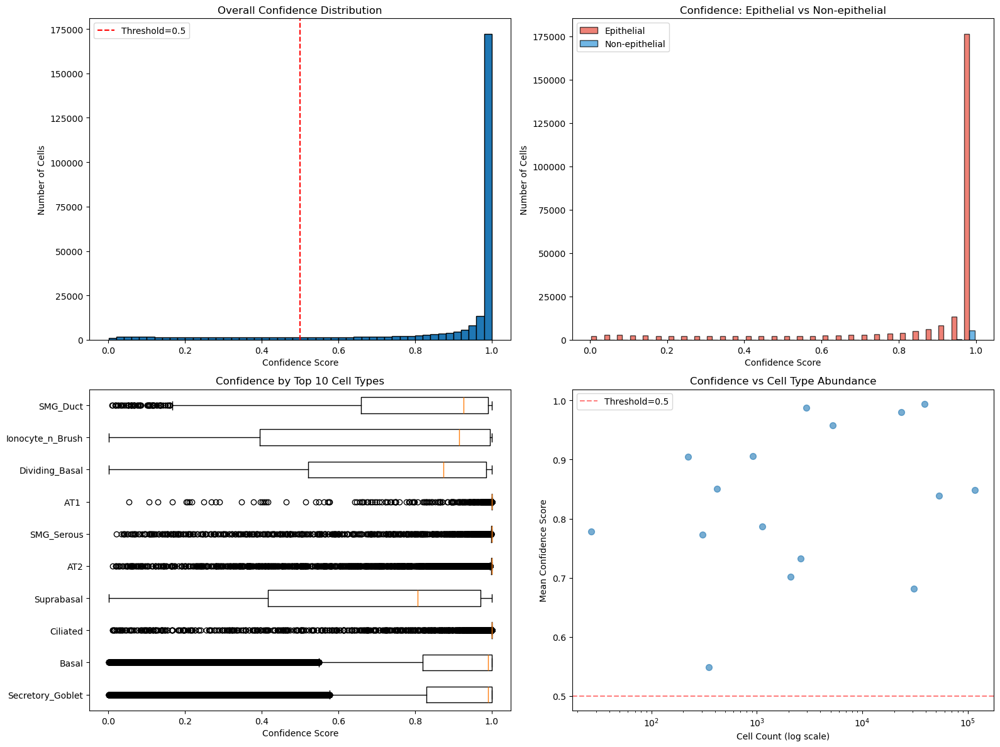

✓ Saved: celltypist_confidence_analysis.png


STEP 10: Marker Gene Validation
Checking marker genes for 9 epithelial cell types...
  Basal          : TP63, KRT5, KRT14, KRT15
  AT1            : AGER, PDPN, CAV1
  AT2            : SFTPC, SFTPB, LAMP3
  Ciliated       : FOXJ1, PIFO, SNTN
  Secretory      : SCGB1A1, SCGB3A1, MUC5B
  Goblet         : MUC5AC, MUC5B, TFF3
  Club           : SCGB1A1, SCGB3A2
  Ionocyte       : FOXI1, CFTR, ATP6V1G3
  Tuft           : POU2F3, TRPM5, GFI1B

10.1 Creating marker gene dotplot...


<Figure size 1250x350 with 0 Axes>

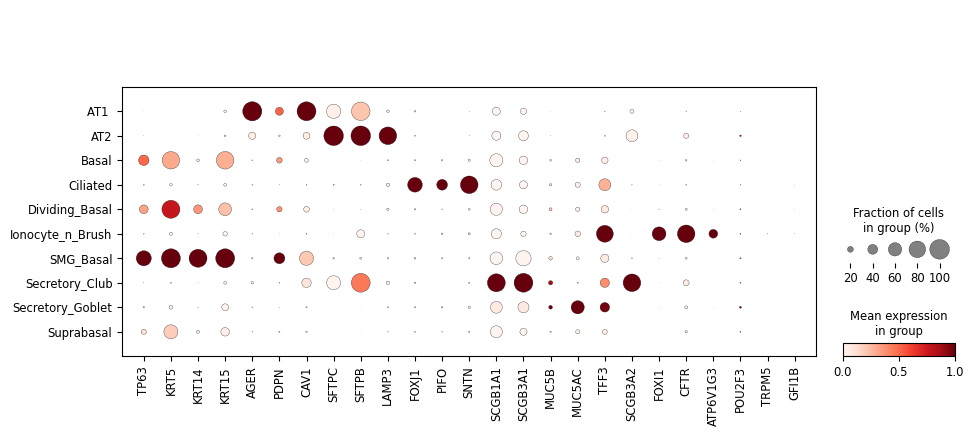

✓ Saved: celltypist_epithelial_markers_dotplot.png

10.2 Creating marker gene violin plots...


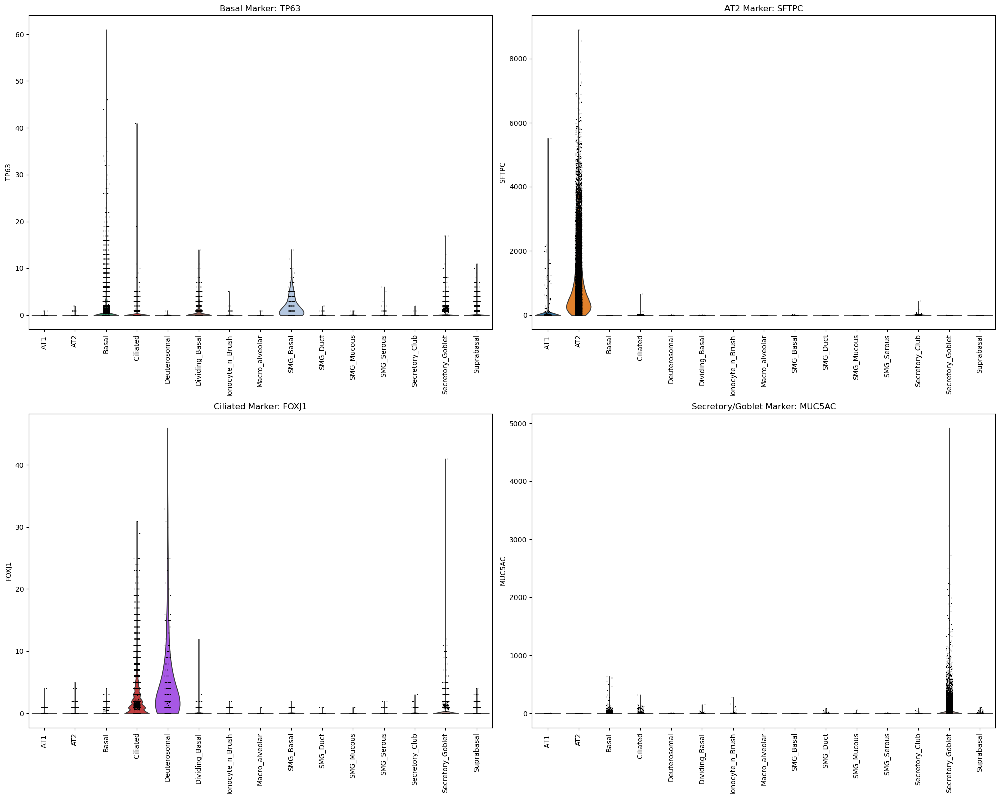

✓ Saved: celltypist_key_markers_violin.png



In [27]:
# ===== STEP 9: Visualization of CellTypist Results =====

print("\n" + "="*80)
print("STEP 9: Visualization of CellTypist Results")
print("="*80)

# 9.1 UMAP colored by CellTypist predictions
print("\n9.1 Generating UMAP plots...")

fig, axes = plt.subplots(2, 2, figsize=(24, 20))

# Plot 1: CellTypist predictions
sc.pl.umap(adata, color='celltypist_pred', 
           title='CellTypist Predictions',
           legend_loc='right margin',
           ax=axes[0, 0], show=False)

# Plot 2: Confidence scores
sc.pl.umap(adata, color='celltypist_conf', 
           title='CellTypist Confidence Scores',
           cmap='viridis', vmin=0, vmax=1,
           ax=axes[0, 1], show=False)

# Plot 3: Epithelial vs Non-epithelial
# ⭐ FIX: Use string keys for boolean palette
sc.pl.umap(adata, color='is_epithelial_like', 
           title='Epithelial-like Classification',
           palette={'True': '#e74c3c', 'False': '#3498db'},  # String keys!
           ax=axes[1, 0], show=False)

# Plot 4: Batch distribution
if 'batch' in adata.obs.columns:
    sc.pl.umap(adata, color='batch', 
               title='Batch Distribution',
               legend_loc='right margin',
               ax=axes[1, 1], show=False)
else:
    axes[1, 1].text(0.5, 0.5, 'No batch information', 
                    ha='center', va='center', fontsize=16)
    axes[1, 1].axis('off')

plt.tight_layout()
plt.savefig(f'{OUTPUT_DIR}/celltypist_umap_overview.png', dpi=300, bbox_inches='tight')
plt.show()
print("✓ Saved: celltypist_umap_overview.png")

# 9.2 Compare original vs majority voting (if applicable)
if CELLTYPIST_MAJORITY_VOTING and changed_cells > 0:
    print("\n9.2 Comparing original predictions vs majority voting...")
    
    fig, axes = plt.subplots(1, 2, figsize=(24, 10))
    
    sc.pl.umap(adata, color='celltypist_pred_original', 
               title='Original CellTypist Predictions',
               legend_loc='right margin',
               ax=axes[0], show=False)
    
    sc.pl.umap(adata, color='celltypist_pred', 
               title='After Majority Voting',
               legend_loc='right margin',
               ax=axes[1], show=False)
    
    plt.tight_layout()
    plt.savefig(f'{OUTPUT_DIR}/celltypist_original_vs_majority.png', dpi=300, bbox_inches='tight')
    plt.show()
    print("✓ Saved: celltypist_original_vs_majority.png")

# 9.3 Cell type composition barplot
print("\n9.3 Creating cell type composition plots...")

fig, axes = plt.subplots(1, 2, figsize=(20, 8))

# All cell types
celltype_counts = adata.obs['celltypist_pred'].value_counts()
axes[0].barh(range(len(celltype_counts)), celltype_counts.values)
axes[0].set_yticks(range(len(celltype_counts)))
axes[0].set_yticklabels(celltype_counts.index.astype(str))
axes[0].set_xlabel('Number of Cells')
axes[0].set_title(f'All Cell Types (n={len(celltype_counts)})')
axes[0].invert_yaxis()

# Epithelial cell types only
epi_celltype_counts = adata.obs[adata.obs['is_epithelial_like']]['celltypist_pred'].value_counts()
if len(epi_celltype_counts) > 0:
    axes[1].barh(range(len(epi_celltype_counts)), epi_celltype_counts.values, color='#e74c3c')
    axes[1].set_yticks(range(len(epi_celltype_counts)))
    axes[1].set_yticklabels(epi_celltype_counts.index.astype(str))
    axes[1].set_xlabel('Number of Cells')
    axes[1].set_title(f'Epithelial-like Types (n={len(epi_celltype_counts)})')
    axes[1].invert_yaxis()
else:
    axes[1].text(0.5, 0.5, 'No epithelial cells detected', ha='center', va='center')
    axes[1].axis('off')

plt.tight_layout()
plt.savefig(f'{OUTPUT_DIR}/celltypist_celltype_composition.png', dpi=300, bbox_inches='tight')
plt.show()
print("✓ Saved: celltypist_celltype_composition.png")

# 9.4 Confidence score distribution
print("\n9.4 Creating confidence score distribution plots...")

fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Overall confidence distribution
axes[0, 0].hist(adata.obs['celltypist_conf'], bins=50, edgecolor='black')
axes[0, 0].axvline(0.5, color='red', linestyle='--', label='Threshold=0.5')
axes[0, 0].set_xlabel('Confidence Score')
axes[0, 0].set_ylabel('Number of Cells')
axes[0, 0].set_title('Overall Confidence Distribution')
axes[0, 0].legend()

# Confidence by epithelial vs non-epithelial
epi_conf = adata.obs[adata.obs['is_epithelial_like']]['celltypist_conf']
non_epi_conf = adata.obs[~adata.obs['is_epithelial_like']]['celltypist_conf']
if len(epi_conf) > 0 and len(non_epi_conf) > 0:
    axes[0, 1].hist([epi_conf, non_epi_conf], bins=30, 
                    label=['Epithelial', 'Non-epithelial'], 
                    alpha=0.7, edgecolor='black', color=['#e74c3c', '#3498db'])
    axes[0, 1].set_xlabel('Confidence Score')
    axes[0, 1].set_ylabel('Number of Cells')
    axes[0, 1].set_title('Confidence: Epithelial vs Non-epithelial')
    axes[0, 1].legend()
elif len(epi_conf) > 0:
    axes[0, 1].hist(epi_conf, bins=30, label='Epithelial', color='#e74c3c', edgecolor='black')
    axes[0, 1].set_xlabel('Confidence Score')
    axes[0, 1].set_ylabel('Number of Cells')
    axes[0, 1].set_title('Confidence: Epithelial cells only')
    axes[0, 1].legend()
else:
    axes[0, 1].text(0.5, 0.5, 'No data', ha='center', va='center')

# Top 10 cell types by confidence
top_celltypes = adata.obs['celltypist_pred'].value_counts().head(10).index.astype(str)
conf_by_type = [adata.obs[adata.obs['celltypist_pred'].astype(str) == ct]['celltypist_conf'].values 
                for ct in top_celltypes]
bp = axes[1, 0].boxplot(conf_by_type, labels=[ct[:20] for ct in top_celltypes], vert=False)
axes[1, 0].set_xlabel('Confidence Score')
axes[1, 0].set_title('Confidence by Top 10 Cell Types')

# Confidence vs cell count scatter
celltype_stats_df = adata.obs.copy()
celltype_stats_df['celltypist_pred_str'] = celltype_stats_df['celltypist_pred'].astype(str)
celltype_stats = celltype_stats_df.groupby('celltypist_pred_str').agg({
    'celltypist_conf': 'mean'
}).rename(columns={'celltypist_conf': 'mean_conf'})
celltype_stats['count'] = celltype_stats_df.groupby('celltypist_pred_str').size()

axes[1, 1].scatter(celltype_stats['count'], celltype_stats['mean_conf'], alpha=0.6, s=50)
axes[1, 1].set_xlabel('Cell Count (log scale)')
axes[1, 1].set_ylabel('Mean Confidence Score')
axes[1, 1].set_xscale('log')
axes[1, 1].set_title('Confidence vs Cell Type Abundance')
axes[1, 1].axhline(0.5, color='red', linestyle='--', alpha=0.5, label='Threshold=0.5')
axes[1, 1].legend()

plt.tight_layout()
plt.savefig(f'{OUTPUT_DIR}/celltypist_confidence_analysis.png', dpi=300, bbox_inches='tight')
plt.show()
print("✓ Saved: celltypist_confidence_analysis.png")

print("\n" + "="*80)


# ===== STEP 10: Marker Gene Validation =====

print("\n" + "="*80)
print("STEP 10: Marker Gene Validation")
print("="*80)

# Define epithelial marker genes
epithelial_markers = {
    'Basal': ['TP63', 'KRT5', 'KRT14', 'KRT15'],
    'AT1': ['AGER', 'PDPN', 'CAV1'],
    'AT2': ['SFTPC', 'SFTPB', 'LAMP3'],
    'Ciliated': ['FOXJ1', 'PIFO', 'SNTN'],
    'Secretory': ['SCGB1A1', 'SCGB3A1', 'MUC5B'],
    'Goblet': ['MUC5AC', 'MUC5B', 'TFF3'],
    'Club': ['SCGB1A1', 'SCGB3A2'],
    'Ionocyte': ['FOXI1', 'CFTR', 'ATP6V1G3'],
    'Tuft': ['POU2F3', 'TRPM5', 'GFI1B']
}

# Check which markers are available
available_markers = {}
for celltype, markers in epithelial_markers.items():
    available = [m for m in markers if m in adata.var_names]
    if available:
        available_markers[celltype] = available

print(f"Checking marker genes for {len(available_markers)} epithelial cell types...")
for celltype, markers in available_markers.items():
    print(f"  {celltype:15s}: {', '.join(markers)}")

# 10.1 Dotplot for epithelial markers
if available_markers and epithelial_count > 0:
    print("\n10.1 Creating marker gene dotplot...")
    
    # Get cells predicted as epithelial
    epi_cells = adata[adata.obs['is_epithelial_like']].copy()
    
    if epi_cells.n_obs > 0:
        # Flatten marker list
        all_markers = []
        for markers in available_markers.values():
            all_markers.extend(markers)
        all_markers = list(dict.fromkeys(all_markers))  # Remove duplicates while preserving order
        
        # Filter markers that exist in data
        all_markers = [m for m in all_markers if m in epi_cells.var_names]
        
        if len(all_markers) > 0:
            # Get unique cell types
            unique_types = epi_cells.obs['celltypist_pred'].value_counts().index[:20]  # Top 20
            epi_cells_subset = epi_cells[epi_cells.obs['celltypist_pred'].isin(unique_types)]
            
            # Create dotplot
            try:
                fig = plt.figure(figsize=(len(all_markers)*0.5, len(unique_types)*0.35))
                sc.pl.dotplot(epi_cells_subset, all_markers, groupby='celltypist_pred',
                             show=False, standard_scale='var')
                plt.tight_layout()
                plt.savefig(f'{OUTPUT_DIR}/celltypist_epithelial_markers_dotplot.png', 
                           dpi=300, bbox_inches='tight')
                plt.show()
                print("✓ Saved: celltypist_epithelial_markers_dotplot.png")
            except Exception as e:
                print(f"⚠️ Could not create dotplot: {e}")
        else:
            print("⚠️ No marker genes found in dataset")
    else:
        print("⚠️ No epithelial cells predicted - skipping marker validation")
else:
    print("⚠️ No markers available or no epithelial cells - skipping marker validation")

# 10.2 Violin plots for key markers
print("\n10.2 Creating marker gene violin plots...")

key_markers = {
    'Basal': 'TP63',
    'AT2': 'SFTPC',
    'Ciliated': 'FOXJ1',
    'Secretory/Goblet': 'MUC5AC'
}

available_key_markers = {k: v for k, v in key_markers.items() if v in adata.var_names}

if len(available_key_markers) > 0:
    n_markers = len(available_key_markers)
    n_cols = 2
    n_rows = (n_markers + 1) // 2
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 8*n_rows))
    if n_rows == 1:
        axes = axes.reshape(1, -1)
    axes = axes.flatten()
    
    for idx, (label, marker) in enumerate(available_key_markers.items()):
        # Get top predicted cell types
        top_types = adata.obs['celltypist_pred'].value_counts().head(15).index
        subset = adata[adata.obs['celltypist_pred'].isin(top_types)]
        
        sc.pl.violin(subset, marker, groupby='celltypist_pred',
                    rotation=90, ax=axes[idx], show=False)
        axes[idx].set_title(f'{label} Marker: {marker}')
    
    # Hide unused subplots
    for idx in range(len(available_key_markers), len(axes)):
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.savefig(f'{OUTPUT_DIR}/celltypist_key_markers_violin.png', dpi=300, bbox_inches='tight')
    plt.show()
    print("✓ Saved: celltypist_key_markers_violin.png")
else:
    print("⚠️ None of the key marker genes found in dataset")

print("\n" + "="*80)

## 💾 Step 10: Save Results

In [ ]:
print("\n" + "="*80)
print("STEP 10: Saving Results")
print("="*80)

# Save annotated adata
output_h5ad = OUTPUT_DIR / "adata_epithelial_celltypist_annotated.h5ad"

print(f"\n💾 Saving annotated data...")
adata.write_h5ad(output_h5ad, compression='gzip', compression_opts=9)

file_size = output_h5ad.stat().st_size / 1e9
print(f"✓ Saved: {output_h5ad}")
print(f"  Size: {file_size:.2f} GB")

In [ ]:
# Export predictions to CSV
print(f"\n📄 Exporting predictions to CSV...")

predictions_df = adata.obs[[
    'celltypist_pred',
    'celltypist_conf'
]].copy()

if CELLTYPIST_MAJORITY_VOTING:
    predictions_df['celltypist_pred_original'] = adata.obs['celltypist_pred_original']

if MANUAL_ANNOTATION_KEY in adata.obs.columns:
    predictions_df[MANUAL_ANNOTATION_KEY] = adata.obs[MANUAL_ANNOTATION_KEY]

if 'batch' in adata.obs.columns:
    predictions_df['batch'] = adata.obs['batch']

predictions_csv = OUTPUT_DIR / "celltypist_predictions.csv"
predictions_df.to_csv(predictions_csv)

print(f"✓ Saved: {predictions_csv}")

In [ ]:
# Save summary statistics
print(f"\n📊 Saving summary statistics...")

summary_file = OUTPUT_DIR / "annotation_summary.txt"

with open(summary_file, 'w') as f:
    f.write("="*80 + "\n")
    f.write("CellTypist Annotation Summary\n")
    f.write("="*80 + "\n\n")
    
    f.write(f"Date: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n")
    f.write(f"Input: {INPUT_H5AD}\n")
    f.write(f"Model: {CELLTYPIST_MODEL}\n")
    f.write(f"Majority Voting: {CELLTYPIST_MAJORITY_VOTING}\n\n")
    
    f.write(f"Dataset:\n")
    f.write(f"  Total cells: {adata.n_obs:,}\n")
    f.write(f"  Total genes: {adata.n_vars:,}\n\n")
    
    f.write(f"Predictions:\n")
    f.write(f"  Cell types predicted: {adata.obs['celltypist_pred'].nunique()}\n")
    f.write(f"  Mean confidence: {adata.obs['celltypist_conf'].mean():.3f}\n")
    f.write(f"  Median confidence: {adata.obs['celltypist_conf'].median():.3f}\n\n")
    
    f.write(f"Cell Type Composition:\n")
    for ct, count in adata.obs['celltypist_pred'].value_counts().items():
        pct = count / adata.n_obs * 100
        f.write(f"  {ct}: {count:,} ({pct:.1f}%)\n")

print(f"✓ Saved: {summary_file}")


STEP 13: Remove Contaminant Cell Types and Save Final Results

13.1 Filtering out contaminant cell types...
Cell types to remove: Macro_alveolar, Erythrocyte

Before filtering: 278,930 cells
  Total cell types: 16

Searching for target cell types:
  Macro_alveolar                :     350 cells ( 0.13%) - Avg conf: 0.549
  Erythrocyte                   :      27 cells ( 0.01%) - Avg conf: 0.778

Filtering Results:
  Before: 278,930 cells, 16 cell types
  After:  278,553 cells, 14 cell types
  Removed: 377 cells (0.14%)


STEP 14: Visualization After Filtering

14.1 Creating overview UMAP plots...


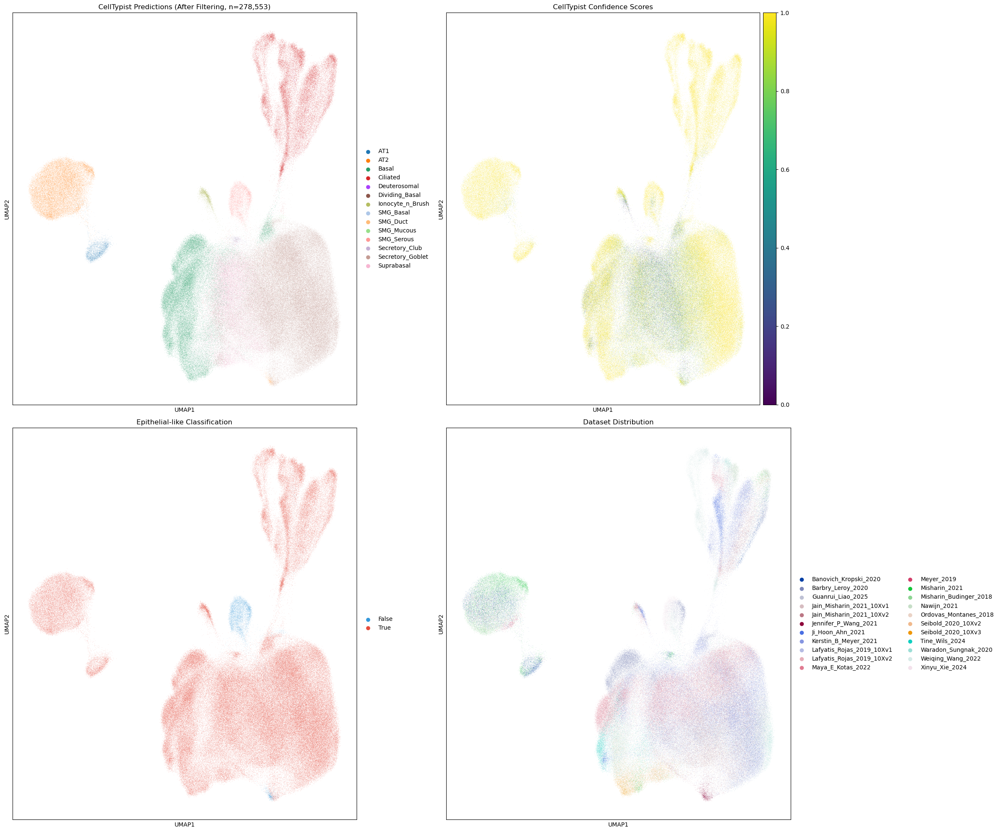

✓ Saved: filtered_final_umap_overview.png

14.2 Creating cell type composition plots...


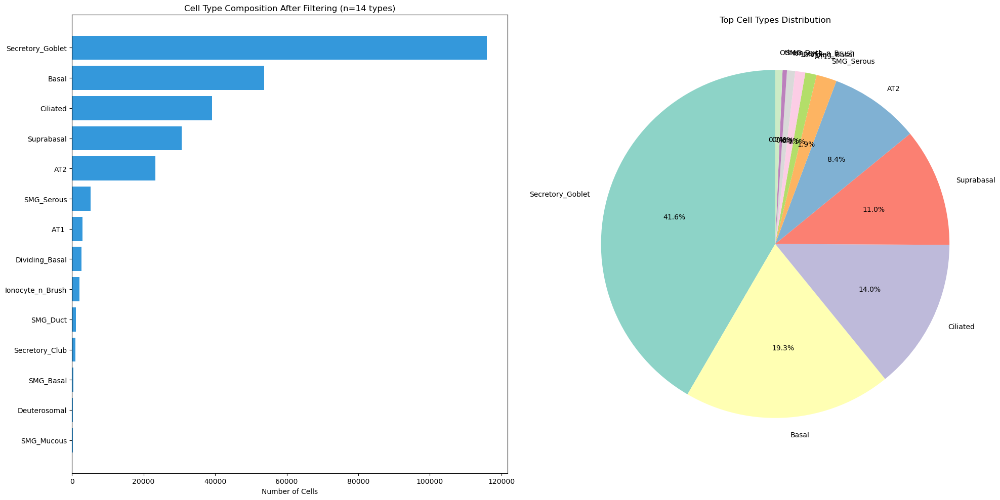

✓ Saved: filtered_celltype_composition.png

14.3 Creating dataset-wise cell type composition...


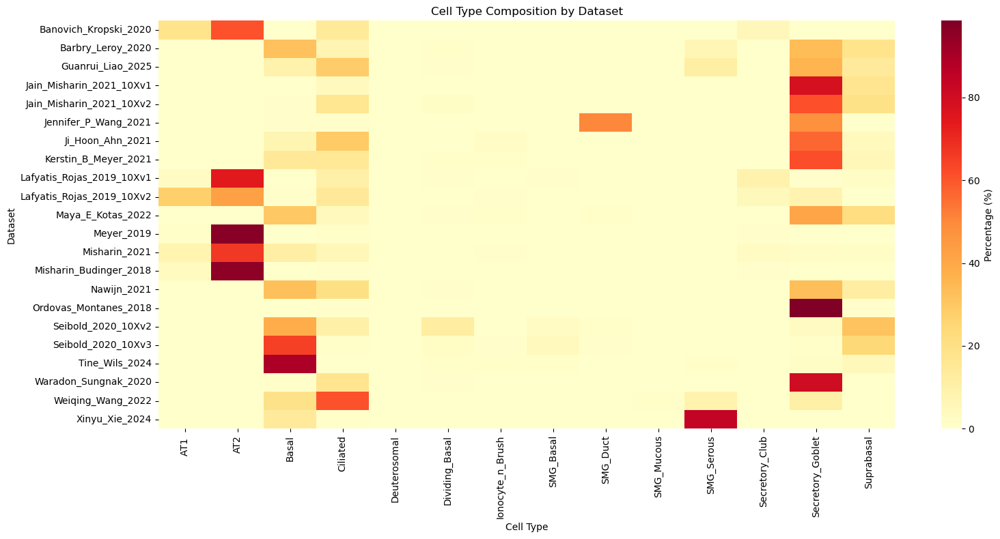

✓ Saved: filtered_dataset_celltype_heatmap.png

Dataset-wise cell type composition (top 15 types, %):
celltypist_pred            Secretory_Goblet  Basal  Ciliated  Suprabasal  \
dataset                                                                    
Banovich_Kropski_2020                  0.18   0.07     14.56        0.01   
Barbry_Leroy_2020                     33.75  32.31      7.44       18.11   
Guanrui_Liao_2025                     35.89   8.93     28.59       14.03   
Jain_Misharin_2021_10Xv1              78.02   0.25      4.09       17.19   
Jain_Misharin_2021_10Xv2              61.39   0.62     16.85       19.28   
Jennifer_P_Wang_2021                  47.94   0.69      0.43        0.26   
Ji_Hoon_Ahn_2021                      56.85   7.13     29.12        4.60   
Kerstin_B_Meyer_2021                  61.58  14.64     15.12        5.97   
Lafyatis_Rojas_2019_10Xv1              0.60   0.00     10.24        1.81   
Lafyatis_Rojas_2019_10Xv2              8.39   0.74     14.73  

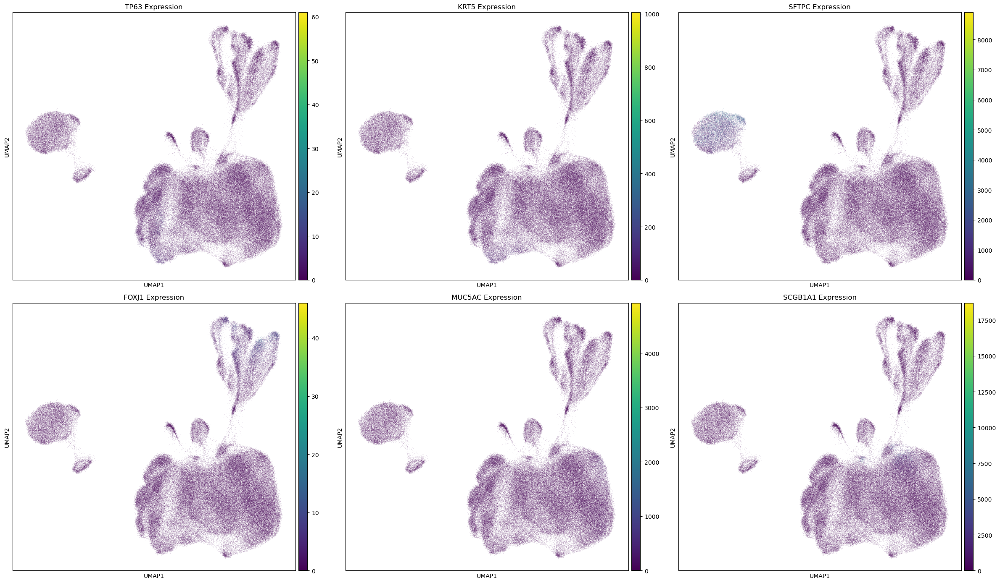

✓ Saved: filtered_marker_genes_umap.png


STEP 15: Final Statistics and Save Results

15.1 Final Dataset Summary:
  Total cells: 278,553
  Total genes: 53,973
  Cell types: 14
  Datasets: 22

  Top 15 cell types:
    Secretory_Goblet                   : 115,875 (41.60%) - Conf: 0.848
    Basal                              :  53,668 (19.27%) - Conf: 0.838
    Ciliated                           :  39,135 (14.05%) - Conf: 0.994
    Suprabasal                         :  30,644 (11.00%) - Conf: 0.681
    AT2                                :  23,326 ( 8.37%) - Conf: 0.980
    SMG_Serous                         :   5,258 ( 1.89%) - Conf: 0.958
    AT1                                :   2,940 ( 1.06%) - Conf: 0.987
    Dividing_Basal                     :   2,614 ( 0.94%) - Conf: 0.732
    Ionocyte_n_Brush                   :   2,097 ( 0.75%) - Conf: 0.702
    SMG_Duct                           :   1,132 ( 0.41%) - Conf: 0.787
    Secretory_Club                     :     916 ( 0.33%) - Conf: 0

... storing 'symbol_base' as categorical


✓ Saved: /home/h2048/data/py/0110/celltypist_epithelial/epithelial_celltypist_filtered_final.h5ad
  File size: 12.47 GB
✓ Saved statistics: /home/h2048/data/py/0110/celltypist_epithelial/filtered_annotation_stats.csv
✓ Saved final report: /home/h2048/data/py/0110/celltypist_epithelial/filtered_final_report.txt

✅ PIPELINE COMPLETED SUCCESSFULLY!

Final dataset characteristics:
  - 278,553 cells
  - 53,973 genes
  - 14 cell types
  - 22 datasets
  - Contaminants removed: Macro_alveolar, Erythrocyte (377 cells)

All results saved to: /home/h2048/data/py/0110/celltypist_epithelial/

Main output file: epithelial_celltypist_filtered_final.h5ad


In [29]:
# ===== STEP 13: Remove Contaminant Cell Types and Save =====

print("\n" + "="*80)
print("STEP 13: Remove Contaminant Cell Types and Save Final Results")
print("="*80)

# 13.1 Identify and remove specific contaminant cell types
print("\n13.1 Filtering out contaminant cell types...")

CELLS_TO_REMOVE = ['Macro_alveolar', 'Erythrocyte']

print(f"Cell types to remove: {', '.join(CELLS_TO_REMOVE)}")

# Count cells before filtering
n_before = adata.n_obs
print(f"\nBefore filtering: {n_before:,} cells")
print(f"  Total cell types: {adata.obs['celltypist_pred'].nunique()}")

# Check if these cell types exist in the data
print(f"\nSearching for target cell types:")
for ct in CELLS_TO_REMOVE:
    # Count cells matching this type (partial match)
    mask = adata.obs['celltypist_pred'].astype(str).str.contains(ct, case=False, na=False)
    count = mask.sum()
    if count > 0:
        pct = count / n_before * 100
        avg_conf = adata.obs[mask]['celltypist_conf'].mean()
        print(f"  {ct:30s}: {count:7,} cells ({pct:5.2f}%) - Avg conf: {avg_conf:.3f}")
    else:
        print(f"  {ct:30s}: Not found")

# Create filter mask (exclude cells matching any of the types to remove)
filter_mask = ~adata.obs['celltypist_pred'].astype(str).str.contains(
    '|'.join(CELLS_TO_REMOVE), case=False, na=False
)

# Apply filter
adata_filtered = adata[filter_mask].copy()

n_after = adata_filtered.n_obs
n_removed = n_before - n_after

print(f"\n{'='*60}")
print(f"Filtering Results:")
print(f"  Before: {n_before:,} cells, {adata.obs['celltypist_pred'].nunique()} cell types")
print(f"  After:  {n_after:,} cells, {adata_filtered.obs['celltypist_pred'].nunique()} cell types")
print(f"  Removed: {n_removed:,} cells ({n_removed/n_before*100:.2f}%)")
print(f"{'='*60}")

# Update adata to the filtered version
adata = adata_filtered
del adata_filtered
import gc
gc.collect()

print("\n" + "="*80)


# ===== STEP 14: Visualization After Filtering =====

print("\n" + "="*80)
print("STEP 14: Visualization After Filtering")
print("="*80)

# 14.1 Overview UMAP plots
print("\n14.1 Creating overview UMAP plots...")

fig, axes = plt.subplots(2, 2, figsize=(24, 20))

# Plot 1: CellTypist predictions
sc.pl.umap(adata, color='celltypist_pred', 
           title=f'CellTypist Predictions (After Filtering, n={adata.n_obs:,})',
           legend_loc='right margin',
           ax=axes[0, 0], show=False)

# Plot 2: Confidence scores
sc.pl.umap(adata, color='celltypist_conf', 
           title='CellTypist Confidence Scores',
           cmap='viridis', vmin=0, vmax=1,
           ax=axes[0, 1], show=False)

# Plot 3: Epithelial-like
sc.pl.umap(adata, color='is_epithelial_like', 
           title='Epithelial-like Classification',
           palette={'True': '#e74c3c', 'False': '#3498db'},
           ax=axes[1, 0], show=False)

# Plot 4: Dataset distribution
if 'dataset' in adata.obs.columns:
    sc.pl.umap(adata, color='dataset', 
               title=f'Dataset Distribution',
               legend_loc='right margin',
               ax=axes[1, 1], show=False)
elif 'batch' in adata.obs.columns:
    sc.pl.umap(adata, color='batch', 
               title=f'Batch Distribution',
               legend_loc='right margin',
               ax=axes[1, 1], show=False)
else:
    axes[1, 1].text(0.5, 0.5, 'No batch/dataset info', 
                    ha='center', va='center', fontsize=14)
    axes[1, 1].axis('off')

plt.tight_layout()
plt.savefig(f'{OUTPUT_DIR}/filtered_final_umap_overview.png', dpi=300, bbox_inches='tight')
plt.show()
print("✓ Saved: filtered_final_umap_overview.png")

# 14.2 Cell type composition after filtering
print("\n14.2 Creating cell type composition plots...")

fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Bar plot
celltype_counts = adata.obs['celltypist_pred'].value_counts()
axes[0].barh(range(len(celltype_counts)), celltype_counts.values, color='#3498db')
axes[0].set_yticks(range(len(celltype_counts)))
axes[0].set_yticklabels(celltype_counts.index.astype(str))
axes[0].set_xlabel('Number of Cells')
axes[0].set_title(f'Cell Type Composition After Filtering (n={len(celltype_counts)} types)')
axes[0].invert_yaxis()

# Pie chart for top cell types
top_10 = celltype_counts.head(10)
other = celltype_counts.iloc[10:].sum()
if other > 0:
    plot_data = pd.concat([top_10, pd.Series({'Others': other})])
else:
    plot_data = top_10

colors = plt.cm.Set3(range(len(plot_data)))
axes[1].pie(plot_data.values, labels=plot_data.index.astype(str), 
           autopct='%1.1f%%', colors=colors, startangle=90)
axes[1].set_title('Top Cell Types Distribution')

plt.tight_layout()
plt.savefig(f'{OUTPUT_DIR}/filtered_celltype_composition.png', dpi=300, bbox_inches='tight')
plt.show()
print("✓ Saved: filtered_celltype_composition.png")

# 14.3 Dataset-wise cell type composition (if applicable)
batch_key = None
if 'dataset' in adata.obs.columns:
    batch_key = 'dataset'
elif 'batch' in adata.obs.columns:
    batch_key = 'batch'

if batch_key and adata.obs[batch_key].nunique() > 1:
    print(f"\n14.3 Creating {batch_key}-wise cell type composition...")
    
    # Create cross-tabulation
    batch_celltype = pd.crosstab(
        adata.obs[batch_key], 
        adata.obs['celltypist_pred'].astype(str),
        normalize='index'
    ) * 100
    
    # Plot heatmap
    fig, ax = plt.subplots(figsize=(max(16, len(batch_celltype.columns)*0.4), 
                                   max(8, len(batch_celltype.index)*0.3)))
    
    import seaborn as sns
    sns.heatmap(batch_celltype, cmap='YlOrRd', annot=False, fmt='.1f', 
               cbar_kws={'label': 'Percentage (%)'}, ax=ax)
    ax.set_title(f'Cell Type Composition by {batch_key.capitalize()}')
    ax.set_xlabel('Cell Type')
    ax.set_ylabel(batch_key.capitalize())
    plt.tight_layout()
    plt.savefig(f'{OUTPUT_DIR}/filtered_{batch_key}_celltype_heatmap.png', dpi=300, bbox_inches='tight')
    plt.show()
    print(f"✓ Saved: filtered_{batch_key}_celltype_heatmap.png")
    
    # Print table (top cell types only)
    top_celltypes = adata.obs['celltypist_pred'].value_counts().head(15).index.astype(str)
    available_cols = [col for col in top_celltypes if col in batch_celltype.columns]
    if len(available_cols) > 0:
        print(f"\n{batch_key.capitalize()}-wise cell type composition (top 15 types, %):")
        print(batch_celltype[available_cols].round(2))

# 14.4 Marker genes visualization
print("\n14.4 Creating marker gene visualizations...")

# Define key epithelial markers
key_markers = ['TP63', 'KRT5', 'SFTPC', 'FOXJ1', 'MUC5AC', 'SCGB1A1']
available_markers = [m for m in key_markers if m in adata.var_names]

if len(available_markers) >= 4:
    n_markers = len(available_markers)
    n_cols = 3
    n_rows = (n_markers + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(8*n_cols, 7*n_rows))
    if n_rows == 1:
        axes = axes.reshape(1, -1)
    axes = axes.flatten()
    
    for idx, marker in enumerate(available_markers):
        sc.pl.umap(adata, color=marker, 
                  title=f'{marker} Expression',
                  cmap='viridis',
                  ax=axes[idx], show=False)
    
    # Hide unused subplots
    for idx in range(len(available_markers), len(axes)):
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.savefig(f'{OUTPUT_DIR}/filtered_marker_genes_umap.png', dpi=300, bbox_inches='tight')
    plt.show()
    print("✓ Saved: filtered_marker_genes_umap.png")
else:
    print(f"⚠️ Only {len(available_markers)} markers available ({', '.join(available_markers)})")

print("\n" + "="*80)


# ===== STEP 15: Final Statistics and Save =====

print("\n" + "="*80)
print("STEP 15: Final Statistics and Save Results")
print("="*80)

# 15.1 Summary statistics
print("\n15.1 Final Dataset Summary:")
print(f"  Total cells: {adata.n_obs:,}")
print(f"  Total genes: {adata.n_vars:,}")
print(f"  Cell types: {adata.obs['celltypist_pred'].nunique()}")
if batch_key:
    print(f"  {batch_key.capitalize()}s: {adata.obs[batch_key].nunique()}")

print("\n  Top 15 cell types:")
for celltype, count in adata.obs['celltypist_pred'].value_counts().head(15).items():
    pct = count / adata.n_obs * 100
    avg_conf = adata.obs[adata.obs['celltypist_pred'].astype(str) == str(celltype)]['celltypist_conf'].mean()
    print(f"    {str(celltype):35s}: {count:7,} ({pct:5.2f}%) - Conf: {avg_conf:.3f}")

if batch_key:
    print(f"\n  {batch_key.capitalize()} distribution:")
    for batch, count in adata.obs[batch_key].value_counts().items():
        pct = count / adata.n_obs * 100
        print(f"    {str(batch):35s}: {count:7,} ({pct:5.2f}%)")

# 15.2 Save final filtered dataset
print("\n15.2 Saving final dataset...")

output_file = f'{OUTPUT_DIR}/epithelial_celltypist_filtered_final.h5ad'
adata.write_h5ad(output_file, compression='gzip')
print(f"✓ Saved: {output_file}")
print(f"  File size: {os.path.getsize(output_file) / 1024**3:.2f} GB")

# 15.3 Save updated statistics
stats_file = f'{OUTPUT_DIR}/filtered_annotation_stats.csv'
celltype_stats_df = adata.obs.copy()
celltype_stats_df['celltypist_pred_str'] = celltype_stats_df['celltypist_pred'].astype(str)

celltype_stats = celltype_stats_df.groupby('celltypist_pred_str').agg({
    'celltypist_conf': ['mean', 'std', 'min', 'max', 'count']
})
celltype_stats.columns = ['Conf_Mean', 'Conf_Std', 'Conf_Min', 'Conf_Max', 'Cell_Count']
celltype_stats = celltype_stats.sort_values('Cell_Count', ascending=False).round(3)
celltype_stats.to_csv(stats_file)
print(f"✓ Saved statistics: {stats_file}")

# 15.4 Save comprehensive final report
from datetime import datetime

report_file = f'{OUTPUT_DIR}/filtered_final_report.txt'
with open(report_file, 'w') as f:
    f.write("="*80 + "\n")
    f.write("CellTypist Annotation - Filtered Final Report\n")
    f.write("="*80 + "\n\n")
    f.write(f"Generated: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n\n")
    
    f.write("="*80 + "\n")
    f.write("PIPELINE PARAMETERS\n")
    f.write("="*80 + "\n")
    f.write(f"CellTypist Model: {CELLTYPIST_MODEL}\n")
    f.write(f"Majority Voting: {CELLTYPIST_MAJORITY_VOTING}\n")
    f.write(f"Cell Types Removed: {', '.join(CELLS_TO_REMOVE)}\n")
    f.write(f"Cells Removed: {n_removed:,} ({n_removed/n_before*100:.2f}%)\n\n")
    
    f.write("="*80 + "\n")
    f.write("DATASET SUMMARY\n")
    f.write("="*80 + "\n")
    f.write(f"Total cells: {adata.n_obs:,}\n")
    f.write(f"Total genes: {adata.n_vars:,}\n")
    f.write(f"Unique cell types: {adata.obs['celltypist_pred'].nunique()}\n")
    if batch_key:
        f.write(f"Number of {batch_key}s: {adata.obs[batch_key].nunique()}\n")
    f.write("\n")
    
    f.write("="*80 + "\n")
    f.write("CELL TYPE DISTRIBUTION\n")
    f.write("="*80 + "\n")
    for celltype, count in adata.obs['celltypist_pred'].value_counts().items():
        pct = count / adata.n_obs * 100
        avg_conf = adata.obs[adata.obs['celltypist_pred'].astype(str) == str(celltype)]['celltypist_conf'].mean()
        f.write(f"{str(celltype):40s}: {count:7,} cells ({pct:6.2f}%) - Avg Conf: {avg_conf:.3f}\n")
    
    f.write("\n" + "="*80 + "\n")
    f.write("CONFIDENCE STATISTICS\n")
    f.write("="*80 + "\n")
    f.write(f"Mean: {adata.obs['celltypist_conf'].mean():.4f}\n")
    f.write(f"Median: {adata.obs['celltypist_conf'].median():.4f}\n")
    f.write(f"Std: {adata.obs['celltypist_conf'].std():.4f}\n")
    f.write(f"Min: {adata.obs['celltypist_conf'].min():.4f}\n")
    f.write(f"Max: {adata.obs['celltypist_conf'].max():.4f}\n")
    
    low_conf = (adata.obs['celltypist_conf'] < 0.5).sum()
    f.write(f"\nLow confidence cells (<0.5): {low_conf:,} ({low_conf/adata.n_obs*100:.2f}%)\n")
    
    if batch_key:
        f.write("\n" + "="*80 + "\n")
        f.write(f"{batch_key.upper()} COMPOSITION\n")
        f.write("="*80 + "\n")
        batch_counts = adata.obs[batch_key].value_counts()
        for batch, count in batch_counts.items():
            pct = count / adata.n_obs * 100
            f.write(f"{str(batch):30s}: {count:7,} cells ({pct:6.2f}%)\n")
    
    f.write("\n" + "="*80 + "\n")
    f.write("OUTPUT FILES\n")
    f.write("="*80 + "\n")
    f.write(f"Main dataset: epithelial_celltypist_filtered_final.h5ad\n")
    f.write(f"Statistics: filtered_annotation_stats.csv\n")
    f.write(f"Report: filtered_final_report.txt\n")
    f.write(f"Figures: Multiple PNG files\n")

print(f"✓ Saved final report: {report_file}")

print("\n" + "="*80)
print("✅ PIPELINE COMPLETED SUCCESSFULLY!")
print("="*80)
print(f"\nFinal dataset characteristics:")
print(f"  - {adata.n_obs:,} cells")
print(f"  - {adata.n_vars:,} genes")
print(f"  - {adata.obs['celltypist_pred'].nunique()} cell types")
if batch_key:
    print(f"  - {adata.obs[batch_key].nunique()} {batch_key}s")
print(f"  - Contaminants removed: {', '.join(CELLS_TO_REMOVE)} ({n_removed:,} cells)")
print(f"\nAll results saved to: {OUTPUT_DIR}/")
print(f"\nMain output file: epithelial_celltypist_filtered_final.h5ad")
print("="*80)

## ✅ Pipeline Complete

In [ ]:
print("\n" + "="*80)
print("PIPELINE COMPLETE")
print("="*80)

print(f"\n📂 Output Directory: {OUTPUT_DIR}")
print(f"\n📄 Generated Files:")
print(f"  1. adata_epithelial_celltypist_annotated.h5ad  (Annotated data)")
print(f"  2. celltypist_predictions.csv                  (Prediction table)")
print(f"  3. annotation_summary.txt                      (Summary statistics)")
if MANUAL_ANNOTATION_KEY in adata.obs.columns:
    print(f"  4. comparison_crosstab.csv                     (Manual vs Predicted)")

print(f"\n📊 Figures (in figures/ subdirectory):")
if has_umap:
    print(f"  - umap_celltypist_predictions.{FIGURE_FORMAT}")
    print(f"  - umap_confidence_scores.{FIGURE_FORMAT}")
    if MANUAL_ANNOTATION_KEY in adata.obs.columns:
        print(f"  - umap_manual_vs_predicted.{FIGURE_FORMAT}")
print(f"  - barplot_cell_composition.{FIGURE_FORMAT}")
print(f"  - violin_confidence_by_celltype.{FIGURE_FORMAT}")

print(f"\n✅ All tasks completed successfully!")

In [ ]:
# Final data check
print(f"\n🔍 Final Data Check:")
print(f"  adata.obs columns added:")
print(f"    - celltypist_pred")
print(f"    - celltypist_conf")
if CELLTYPIST_MAJORITY_VOTING:
    print(f"    - celltypist_pred_original")

print(f"\n  Example predictions:")
print(adata.obs[['celltypist_pred', 'celltypist_conf']].head(10))